# Compare and contrast Denoising Diffusion Probabilistic Model (DDPM) models vs Elucidated Diffusion Models

This notebook implements the EDM (Elucidated Diffusion Model) described in the paper (2206.00364v2.pdf).

It will implement both a baseline DDPM and a EDM using PyTorch and contrast the results.

## 1. Install and Import Required Libraries

We will use PyTorch, torchvision, numpy, matplotlib, and tqdm. If running locally, ensure these packages are installed.

In [1]:
# Install required packages (uncomment if running in a new environment)
# !pip install torch torchvision matplotlib tqdm numpy

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import random
import time
from tqdm import tqdm


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
max_training_time = 60*5
display_interval = 30


## 2. Load and Preprocess Dataset

We will use any image directory for demonstration. The images will be normalized to [-1, 1] as required by most diffusion models.

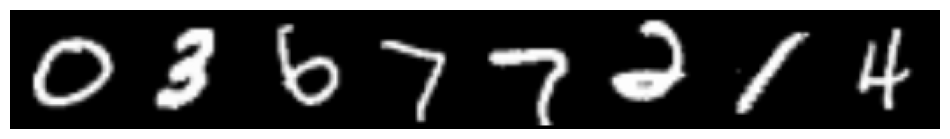

In [1]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Scale to [-1, 1] (diffusion models expect this)
def scale_to_minus_one_to_one(x):
    return x * 2. - 1.

# Transform MNIST to 64x64 RGB (expand single channel to 3)
transform_mnist = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Lambda(scale_to_minus_one_to_one),
    transforms.Lambda(lambda x: x.repeat(3, 1, 1))  # make 1-channel -> 3-channel
])

batch_size = 128
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_mnist)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Quick visualization
examples, _ = next(iter(train_loader))
examples = examples[:8]  # first 8 images
import matplotlib.pyplot as plt
import torchvision.utils as vutils

grid = vutils.make_grid((examples * 0.5 + 0.5).clamp(0,1), nrow=8)
plt.figure(figsize=(12,2))
plt.imshow(grid.permute(1,2,0).cpu().numpy())
plt.axis("off")
plt.show()


## 3. Define the Diffusion Model Architecture

We will use a simple U-Net-like architecture suitable for MNIST. For more complex datasets, a deeper U-Net or transformer-based model may be used.

In [4]:
# Standard U-Net with skip connections and timestep embedding for 28x28 images (fixed output channels)
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = np.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb

class UNet28(nn.Module):
    def __init__(self, emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(emb_dim),
            nn.Linear(emb_dim, emb_dim),
            nn.ReLU(),
        )
        self.inc = nn.Conv2d(1, 32, 3, padding=1)
        self.down1 = nn.Conv2d(32, 64, 4, stride=2, padding=1)  # 28x28 -> 14x14
        self.down2 = nn.Conv2d(64, 128, 4, stride=2, padding=1) # 14x14 -> 7x7
        self.emb1 = nn.Linear(emb_dim, 64)
        self.emb2 = nn.Linear(emb_dim, 128)
        self.middle = nn.Sequential(
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU()
        )
        self.up2 = nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1) # 7x7 -> 14x14
        self.up1 = nn.ConvTranspose2d(128, 32, 4, stride=2, padding=1) # 14x14 -> 28x28
        self.emb_up2 = nn.Linear(emb_dim, 64)
        self.emb_up1 = nn.Linear(emb_dim, 32)
        self.outc = nn.Conv2d(64, 1, 1)  # 32+32=64 after concat
    def forward(self, x, t):
        if t.dim() == 1:
            t = t.float()
        else:
            t = t.squeeze(-1).float()
        emb = self.time_mlp(t)
        x1 = F.relu(self.inc(x))
        x2 = F.relu(self.down1(x1) + self.emb1(emb).unsqueeze(-1).unsqueeze(-1))
        x3 = F.relu(self.down2(x2) + self.emb2(emb).unsqueeze(-1).unsqueeze(-1))
        m = self.middle(x3)
        u2 = F.relu(self.up2(m) + self.emb_up2(emb).unsqueeze(-1).unsqueeze(-1))
        # Crop x2 to match u2 if needed
        if u2.shape[-2:] != x2.shape[-2:]:
            diffY = x2.size(-2) - u2.size(-2)
            diffX = x2.size(-1) - u2.size(-1)
            u2 = F.pad(u2, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        u2 = torch.cat([u2, x2], dim=1)
        u1 = F.relu(self.up1(u2) + self.emb_up1(emb).unsqueeze(-1).unsqueeze(-1))
        # Crop x1 to match u1 if needed
        if u1.shape[-2:] != x1.shape[-2:]:
            diffY = x1.size(-2) - u1.size(-2)
            diffX = x1.size(-1) - u1.size(-1)
            u1 = F.pad(u1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        u1 = torch.cat([u1, x1], dim=1)
        out = self.outc(u1)
        return out
    
class UNet64(nn.Module):
    def __init__(self, emb_dim=128):
        super().__init__()
        # Time embedding
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(emb_dim),
            nn.Linear(emb_dim, emb_dim),
            nn.ReLU(),
        )

        # Encoder
        self.inc = nn.Conv2d(3, 64, 3, padding=1)              # 64x64 -> 64x64
        self.down1 = nn.Conv2d(64, 128, 4, stride=2, padding=1)  # 64x64 -> 32x32
        self.down2 = nn.Conv2d(128, 256, 4, stride=2, padding=1) # 32x32 -> 16x16
        self.down3 = nn.Conv2d(256, 512, 4, stride=2, padding=1) # 16x16 -> 8x8

        # Time embeddings for skips
        self.emb1 = nn.Linear(emb_dim, 128)
        self.emb2 = nn.Linear(emb_dim, 256)
        self.emb3 = nn.Linear(emb_dim, 512)

        # Bottleneck
        self.middle = nn.Sequential(
            nn.Conv2d(512, 512, 3, padding=1), nn.ReLU(),
            nn.Conv2d(512, 512, 3, padding=1), nn.ReLU(),
        )

        # Decoder
        self.up3 = nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1) # 8x8 -> 16x16
        self.up2 = nn.ConvTranspose2d(512, 128, 4, stride=2, padding=1) # 16x16 -> 32x32
        self.up1 = nn.ConvTranspose2d(256, 64, 4, stride=2, padding=1)  # 32x32 -> 64x64

        self.emb_up3 = nn.Linear(emb_dim, 256)
        self.emb_up2 = nn.Linear(emb_dim, 128)
        self.emb_up1 = nn.Linear(emb_dim, 64)

        self.outc = nn.Conv2d(128, 3, 1)  # 64 + 64 = 128 after concat

    def forward(self, x, t):
        # Time embedding
        if t.dim() == 1:
            t = t.float()
        else:
            t = t.squeeze(-1).float()
        emb = self.time_mlp(t)

        # Encoder
        x1 = F.relu(self.inc(x))  # (B,64,64,64)
        x2 = F.relu(self.down1(x1) + self.emb1(emb)[:, :, None, None])
        x3 = F.relu(self.down2(x2) + self.emb2(emb)[:, :, None, None])
        x4 = F.relu(self.down3(x3) + self.emb3(emb)[:, :, None, None])

        # Middle
        m = self.middle(x4)

        # Decoder
        u3 = F.relu(self.up3(m) + self.emb_up3(emb)[:, :, None, None])
        u3 = torch.cat([u3, x3], dim=1)

        u2 = F.relu(self.up2(u3) + self.emb_up2(emb)[:, :, None, None])
        u2 = torch.cat([u2, x2], dim=1)

        u1 = F.relu(self.up1(u2) + self.emb_up1(emb)[:, :, None, None])
        u1 = torch.cat([u1, x1], dim=1)

        out = self.outc(u1)
        return out







In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# -----------------------------
# Positional embedding for timestep/sigma
# -----------------------------
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb


# -----------------------------
# Simple self-attention block
# -----------------------------
class SelfAttention(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.norm = nn.GroupNorm(8, channels)
        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1)
        self.proj = nn.Conv2d(channels, channels, kernel_size=1)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x)
        q, k, v = self.qkv(h).chunk(3, dim=1)
        q = q.reshape(B, C, H*W).permute(0, 2, 1)  # B, HW, C
        k = k.reshape(B, C, H*W)                    # B, C, HW
        attn = torch.bmm(q, k) / (C ** 0.5)
        attn = F.softmax(attn, dim=-1)
        v = v.reshape(B, C, H*W).permute(0, 2, 1)
        h = torch.bmm(attn, v).permute(0, 2, 1).reshape(B, C, H, W)
        return x + self.proj(h)


# -----------------------------
# Residual block with optional attention
# -----------------------------
class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, emb_dim, use_attention=False):
        super().__init__()
        self.use_attention = use_attention
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.time_mlp = nn.Linear(emb_dim, out_ch)
        if use_attention:
            self.attn = SelfAttention(out_ch)
        if in_ch != out_ch:
            self.skip = nn.Conv2d(in_ch, out_ch, 1)
        else:
            self.skip = nn.Identity()

    def forward(self, x, t_emb):
        h = F.relu(self.conv1(x))
        h = h + self.time_mlp(t_emb)[:, :, None, None]
        h = F.relu(self.conv2(h))
        if self.use_attention:
            h = self.attn(h)
        return h + self.skip(x)


# -----------------------------
# 64x64 RGB U-Net (channel-corrected)
# -----------------------------
class UNet128(nn.Module):
    def __init__(self, in_channels=3, base_ch=64, emb_dim=128, use_attention=True):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(emb_dim),
            nn.Linear(emb_dim, emb_dim),
            nn.ReLU()
        )

        # Down path
        self.inc = ResBlock(in_channels, base_ch, emb_dim)
        self.down1 = ResBlock(base_ch, base_ch*2, emb_dim)
        self.down2 = ResBlock(base_ch*2, base_ch*4, emb_dim, use_attention=use_attention)
        self.down3 = ResBlock(base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)
        self.pool = nn.AvgPool2d(2)

        # Middle
        self.mid = ResBlock(base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)

        # Up path (channels corrected!)
        self.up3 = nn.ConvTranspose2d(base_ch*4, base_ch*4, 2, stride=2)
        self.up_block3 = ResBlock(base_ch*4 + base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)

        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, stride=2)
        self.up_block2 = ResBlock(base_ch*2 + base_ch*4, base_ch*2, emb_dim)

        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, stride=2)
        self.up_block1 = ResBlock(base_ch + base_ch*2, base_ch, emb_dim)

        # Output
        self.outc = nn.Conv2d(base_ch, in_channels, 1)

    def forward(self, x, t):
        if t.dim() == 1:
            t = t.float()
        else:
            t = t.squeeze(-1).float()
        t_emb = self.time_mlp(t)

        # Downsampling
        x1 = self.inc(x, t_emb)            # 64x64 -> 64x64
        x2 = self.down1(self.pool(x1), t_emb)  # 64->32
        x3 = self.down2(self.pool(x2), t_emb)  # 32->16
        x4 = self.down3(self.pool(x3), t_emb)  # 16->8

        # Middle
        m = self.mid(self.pool(x4), t_emb)     # 8->4

        # Upsampling
        u3 = self.up_block3(torch.cat([self.up3(m), x4], dim=1), t_emb)  # 4->8
        u2 = self.up_block2(torch.cat([self.up2(u3), x3], dim=1), t_emb) # 8->16
        u1 = self.up_block1(torch.cat([self.up1(u2), x2], dim=1), t_emb) # 16->32

        # Final upsample to original size
        u_final = F.interpolate(u1, size=x.shape[-2:], mode='bilinear', align_corners=False)
        return self.outc(u_final)


In [7]:

#model = UNet28().to(device)
#print(model)

# Instantiate
#model = UNet64().to(device)
#print(model)

model = UNet128(use_attention=True).to(device)
print(model)

UNet128(
  (time_mlp): Sequential(
    (0): SinusoidalPosEmb()
    (1): Linear(in_features=128, out_features=128, bias=True)
    (2): ReLU()
  )
  (inc): ResBlock(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (time_mlp): Linear(in_features=128, out_features=64, bias=True)
    (skip): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (down1): ResBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (time_mlp): Linear(in_features=128, out_features=128, bias=True)
    (skip): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
  )
  (down2): ResBlock(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (time_mlp): Linear(in_features=128, out_f

## 4. Implement the Forward Diffusion Process

The forward process gradually adds Gaussian noise to the data over a fixed number of timesteps.

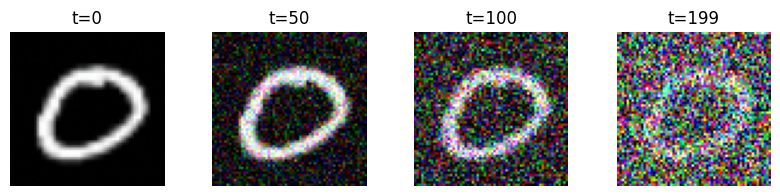

In [ ]:
# Forward diffusion process
import torch
T = 200  # Number of diffusion steps
beta_start = 1e-4
beta_end = 0.02
betas = torch.linspace(beta_start, beta_end, T, device=device)
alphas = 1. - betas
alpha_bars = torch.cumprod(alphas, dim=0)

def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)
    sqrt_alpha_bar = alpha_bars[t].sqrt().view(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar = (1 - alpha_bars[t]).sqrt().view(-1, 1, 1, 1)
    return sqrt_alpha_bar * x_start + sqrt_one_minus_alpha_bar * noise

# Visualize noisy images at different timesteps
x = examples[:4].to(device)  # batch of clean images
timesteps = torch.tensor([0, T//4, T//2, T-1], device=device)

noisy_imgs = [q_sample(x, t.repeat(x.size(0)), noise=None) for t in timesteps]

fig, axes = plt.subplots(1, 4, figsize=(10, 2))
for i, img in enumerate(noisy_imgs):
    img_disp = img[0].detach().cpu()
    img_disp = (img_disp * 0.5 + 0.5).clamp(0, 1)   # unscale [-1,1] → [0,1]
    img_disp = img_disp.permute(1, 2, 0).numpy()   # CHW → HWC
    axes[i].imshow(img_disp)
    axes[i].set_title(f"t={timesteps[i].item()}")
    axes[i].axis('off')
plt.show()


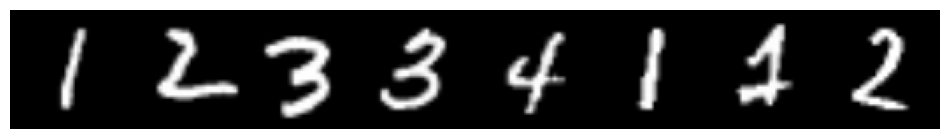

In [9]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Scale to [-1, 1] (diffusion models expect this)
def scale_to_minus_one_to_one(x):
    return x * 2. - 1.

# Transform MNIST to 64x64 RGB (expand single channel to 3)
transform_mnist = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Lambda(scale_to_minus_one_to_one),
    transforms.Lambda(lambda x: x.repeat(3, 1, 1))  # make 1-channel -> 3-channel
])

batch_size = 128
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_mnist)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Quick visualization
examples, _ = next(iter(train_loader))
examples = examples[:8]  # first 8 images
import matplotlib.pyplot as plt
import torchvision.utils as vutils

grid = vutils.make_grid((examples * 0.5 + 0.5).clamp(0,1), nrow=8)
plt.figure(figsize=(12,2))
plt.imshow(grid.permute(1,2,0).cpu().numpy())
plt.axis("off")
plt.show()


## 5. Implement the Reverse (Denoising) Process a DDPM architecture.

The reverse process uses the model to predict the noise at each timestep and denoise the image step by step.

### 5a. define denoising functions

In [10]:
# Reverse (denoising) process for sampling
def p_sample(model, x, t):
    beta = betas[t]
    sqrt_one_minus_alpha_bar = (1 - alpha_bars[t]).sqrt()
    sqrt_recip_alpha = (1. / alphas[t]).sqrt()
    t_tensor = torch.full((x.size(0),), t, device=device, dtype=torch.long)
    model_out = model(x, t_tensor)
    model_mean = sqrt_recip_alpha * (x - beta / sqrt_one_minus_alpha_bar * model_out)
    if t > 0:
        noise = torch.randn_like(x)
        return model_mean + beta.sqrt() * noise
    else:
        return model_mean

def p_sample_loop(model, shape):
    device = next(model.parameters()).device
    x = torch.randn(shape, device=device)
    for t in reversed(range(T)):
        x = p_sample(model, x, t)
    return x

In [ ]:
import torchvision.utils as vutils

def sample_and_save(model, title, n=16, fname=None):
    model.eval()
    with torch.no_grad():
        samples = p_sample_loop(model, (n, 3, 64, 64))  # sample n images
        samples = (samples * 0.5 + 0.5).clamp(0, 1)     # unscale from [-1,1] to [0,1]
    model.train()

    # Make a nice grid
    grid = vutils.make_grid(samples, nrow=int(n**0.5))
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.title(title)
    plt.imshow(grid.permute(1,2,0).cpu().numpy())
    if fname:
        plt.savefig(fname, bbox_inches="tight")
    plt.show()

### 5b. Train the DDPM

Set up the training loop, loss function, and optimizer. The model is trained to predict the noise added at each timestep.

Epoch 1 Loss: 1.0303:   0%|          | 0/469 [00:00<?, ?it/s]

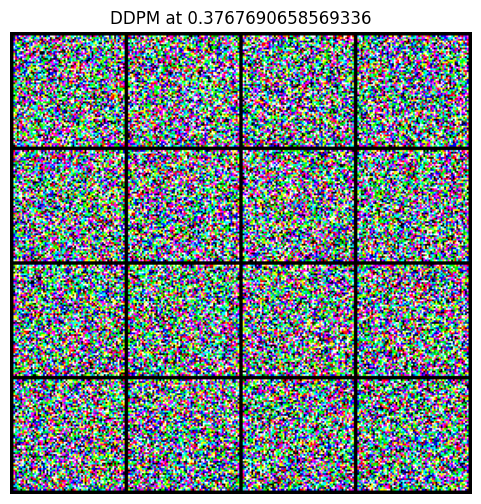

Epoch 1 Loss: 0.7896:  28%|██▊       | 133/469 [00:30<01:08,  4.87it/s]

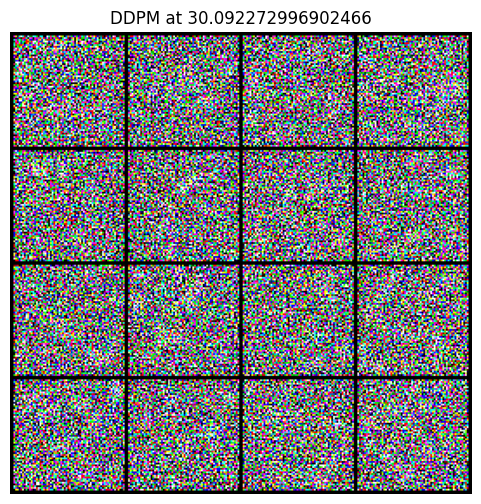

Epoch 1 Loss: 0.7793:  57%|█████▋    | 267/469 [01:00<00:41,  4.86it/s]

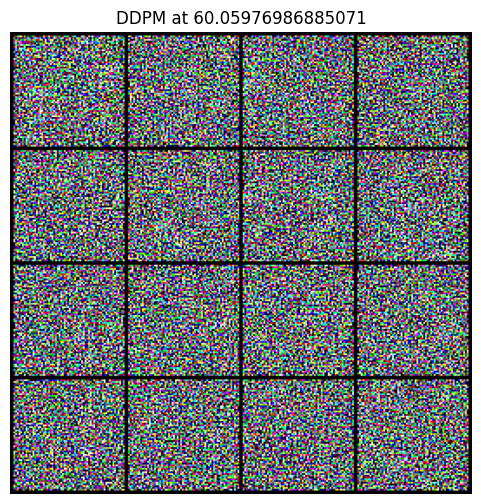

Epoch 1 Loss: 0.7724:  86%|████████▌ | 401/469 [01:30<00:14,  4.81it/s]

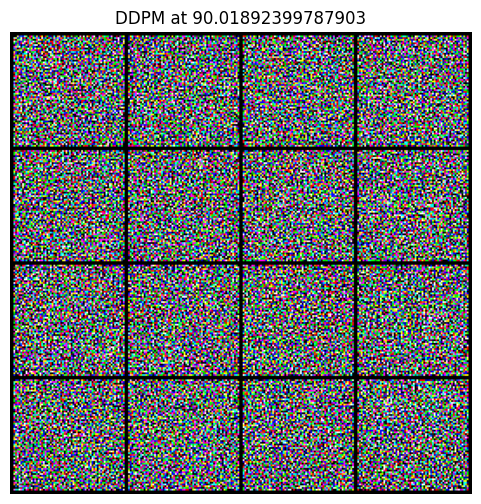

Epoch 2 Loss: 0.7649:  13%|█▎        | 63/469 [00:13<01:25,  4.74it/s]

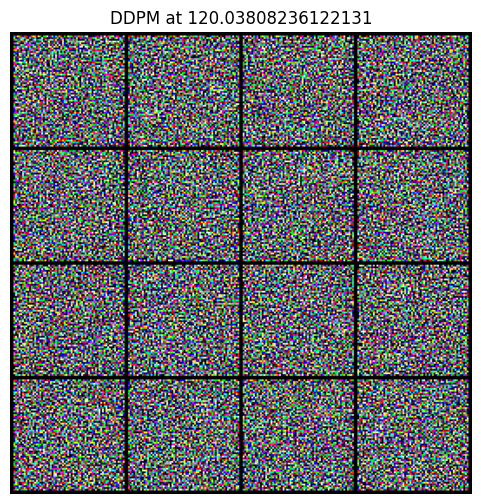

Epoch 2 Loss: 0.7678:  42%|████▏     | 197/469 [00:43<00:56,  4.80it/s]

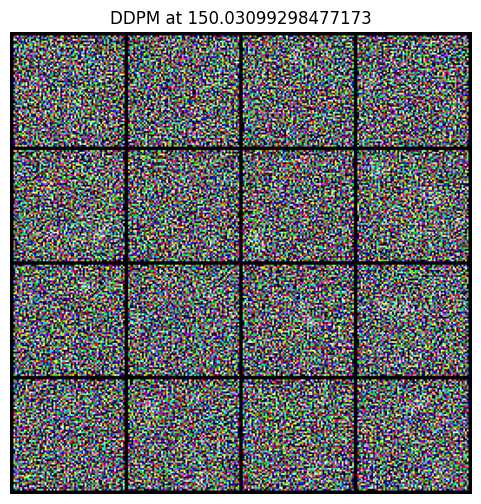

Epoch 2 Loss: 0.7671:  71%|███████   | 332/469 [01:13<00:28,  4.83it/s]

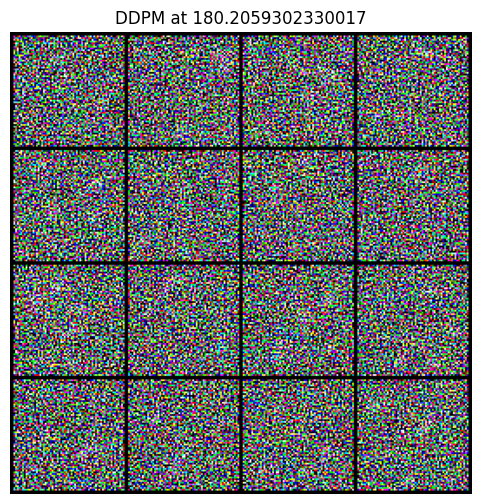

Epoch 2 Loss: 0.7666:  99%|█████████▉| 466/469 [01:43<00:00,  4.78it/s]

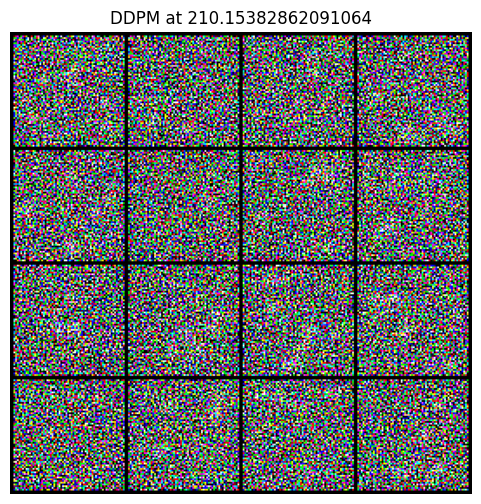

Epoch 3 Loss: 0.7623:  28%|██▊       | 129/469 [00:27<01:11,  4.73it/s]

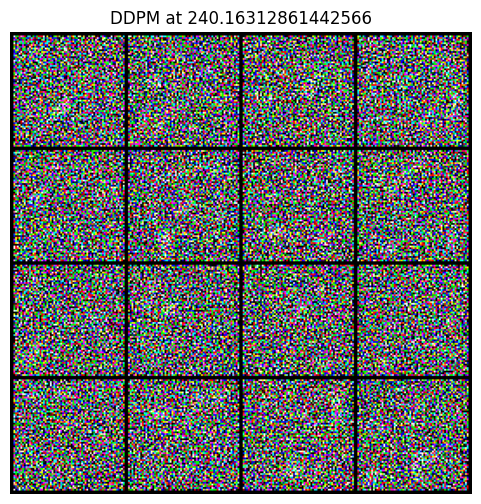

Epoch 3 Loss: 0.7638:  56%|█████▌    | 261/469 [00:57<00:43,  4.80it/s]

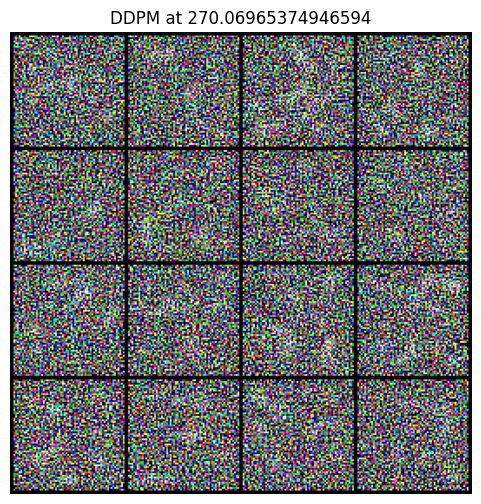

Epoch 3 Loss: 0.7631:  66%|██████▌   | 308/469 [01:09<00:36,  4.45it/s]


KeyboardInterrupt: 

In [13]:
# Training loop for DDPM (28x28, new U-Net with timestep embedding)

model = UNet128(use_attention=True).to(device)

optimizer = optim.Adam(model.parameters(), lr=2e-4)
epochs = 99  # For demonstration; increase for better results
t0 = time.time()
next_display_time = t0
for epoch in range(epochs):
    if time.time() > t0 + max_training_time:
        break
    pbar = tqdm(train_loader)
    for idx, (x, _) in enumerate(pbar):
        x = x.to(device)
        t = torch.randint(0, T, (x.size(0),), device=device).long()
        noise = torch.randn_like(x)
        x_noisy = q_sample(x, t, noise)
        noise_pred = model(x_noisy, t)
        loss = F.mse_loss(noise_pred, noise)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        pbar.set_description(f"Epoch {epoch+1} Loss: {loss.item():.4f}")
        if time.time() > next_display_time or time.time() > t0 + max_training_time:
            next_display_time += display_interval
            sample_and_save(model,title=f"DDPM at {time.time() - t0}")
            if time.time() > t0 + max_training_time:
                break

## 6. Elucidated Diffusion Model (EDM) Implementation

This section implements the EDM as described in the paper (2206.00364v2.pdf), including its unique noise schedule, loss weighting, and sampling procedure.

### 6a. EDM loss and schedule functions.

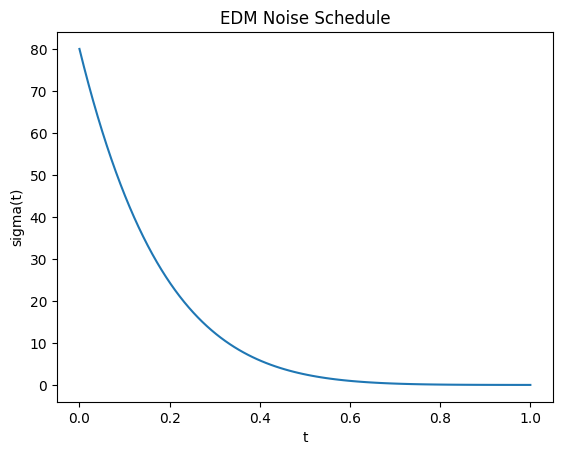

In [14]:
# EDM noise schedule, loss weighting, and sampling procedure

# EDM parameters from NVIDIA's reference
P_mean = -1.2  # Mean of log-normal distribution for sigma sampling
P_std = 1.2    # Std of log-normal distribution for sigma sampling
sigma_data = 0.5  # Data standard deviation
sigma_min = 0.002
sigma_max = 80
rho = 7

# EDM noise schedule (sampling)
def edm_sigma_schedule(t):
    return (sigma_max ** (1/rho) + t * (sigma_min ** (1/rho) - sigma_max ** (1/rho))) ** rho

# EDM loss weighting - CORRECTED according to NVIDIA's implementation
# weight = (σ² + σ_data²) / (σ × σ_data)²
def edm_loss_weight(sigma, sigma_data=sigma_data):
    return (sigma ** 2 + sigma_data ** 2) / (sigma * sigma_data) ** 2

# Example: plot the EDM noise schedule
ts = torch.linspace(0, 1, 100)
sigmas = edm_sigma_schedule(ts)
plt.plot(ts.numpy(), sigmas.numpy())
plt.xlabel('t')
plt.ylabel('sigma(t)')
plt.title('EDM Noise Schedule')
plt.show()

### 6b. EDM Sampling / Reconstruction

In [15]:
# EDM sampling procedure - Following NVIDIA's edm_sampler (Algorithm 2)
def edm_ancestral_sampling(model, num_steps=18, batch_size=8, img_shape=(1, 28, 28)):
    device = next(model.parameters()).device
    
    # Initialize noise
    x_next = torch.randn((batch_size,) + img_shape, device=device)
    
    # Time step schedule (matching NVIDIA's implementation)
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (sigma_max ** (1/rho) + step_indices / (num_steps - 1) * 
               (sigma_min ** (1/rho) - sigma_max ** (1/rho))) ** rho
    t_steps = torch.cat([t_steps, torch.zeros_like(t_steps[:1])])  # t_N = 0
    
    # Initialize with first noise level
    x_next = x_next * t_steps[0]
    
    # Main sampling loop (Heun's method)
    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        x_cur = x_next
        
        # Preconditioning coefficients for current timestep
        sigma = t_cur.float()
        c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
        c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
        c_in = 1 / (sigma_data ** 2 + sigma ** 2).sqrt()
        c_noise = sigma.log() / 4
        
        # Euler step
        F_x = model(c_in * x_cur, c_noise.expand(batch_size))
        denoised = c_skip * x_cur + c_out * F_x
        d_cur = (x_cur - denoised) / t_cur
        x_next = x_cur + (t_next - t_cur) * d_cur
        
        # Apply 2nd order correction (Heun's method) - except for last step
        if i < num_steps - 1:
            # Preconditioning coefficients for next timestep
            sigma_next = t_next.float()
            c_skip_next = sigma_data ** 2 / (sigma_next ** 2 + sigma_data ** 2)
            c_out_next = sigma_next * sigma_data / (sigma_next ** 2 + sigma_data ** 2).sqrt()
            c_in_next = 1 / (sigma_data ** 2 + sigma_next ** 2).sqrt()
            c_noise_next = sigma_next.log() / 4
            
            F_x_next = model(c_in_next * x_next, c_noise_next.expand(batch_size))
            denoised_next = c_skip_next * x_next + c_out_next * F_x_next
            d_prime = (x_next - denoised_next) / t_next
            x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)
    
    return x_next

In [16]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def show_edm_samples(model, batch_size=16, img_shape=(3,64,64), num_steps=18, title="EDM Samples"):
    """
    Generate and visualize EDM samples.
    """
    model.eval()
    with torch.no_grad():
        samples = edm_ancestral_sampling(model, num_steps=num_steps, batch_size=batch_size, img_shape=img_shape).cpu()
        samples = (samples + 1) / 2  # scale from [-1,1] to [0,1]
        samples = samples.clamp(0, 1)
    
    # Create a grid
    grid = vutils.make_grid(samples, nrow=int(batch_size**0.5))
    
    plt.figure(figsize=(6,6))
    plt.axis("off")
    plt.title(title)
    plt.imshow(grid.permute(1,2,0).numpy())
    plt.show()
    
    model.train()


# 6c. EDM Training Loop 

EDM Epoch 1 Loss: 1.6338:   0%|          | 0/469 [00:00<?, ?it/s]

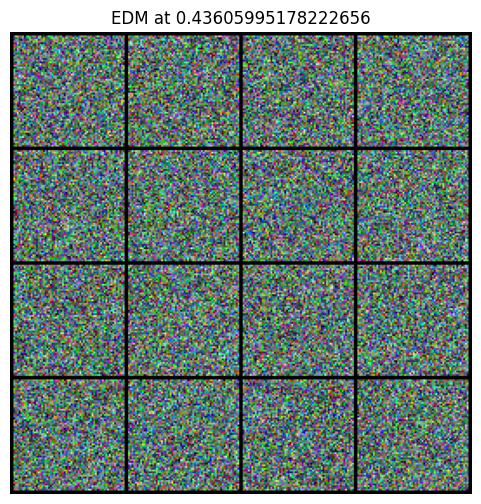

EDM Epoch 1 Loss: 0.6245:  30%|██▉       | 140/469 [00:30<01:08,  4.81it/s]

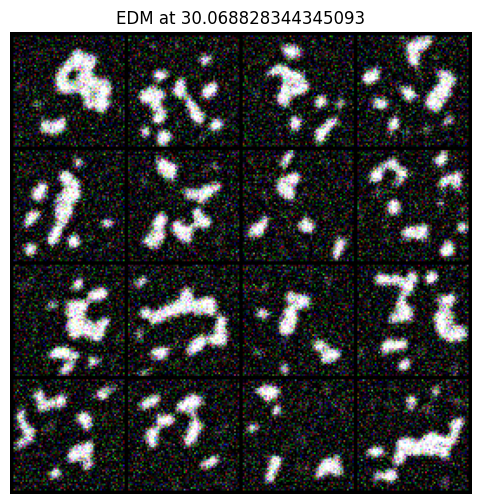

EDM Epoch 1 Loss: 0.5657:  60%|██████    | 282/469 [01:00<00:38,  4.84it/s]

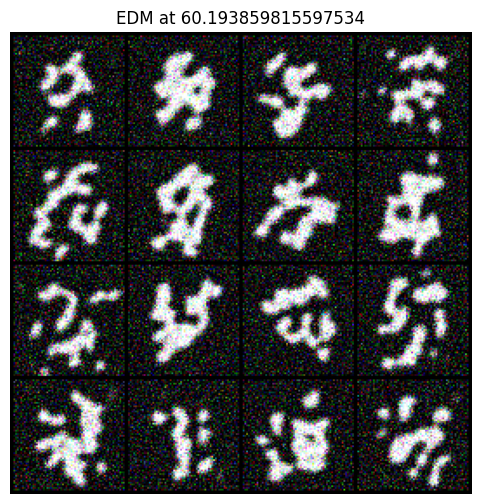

EDM Epoch 1 Loss: 0.5671:  90%|█████████ | 423/469 [01:30<00:09,  4.82it/s]

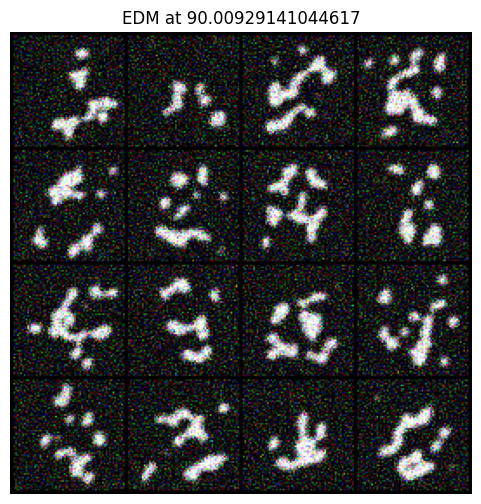

EDM Epoch 2 Loss: 0.5913:  20%|██        | 94/469 [00:20<01:17,  4.82it/s]

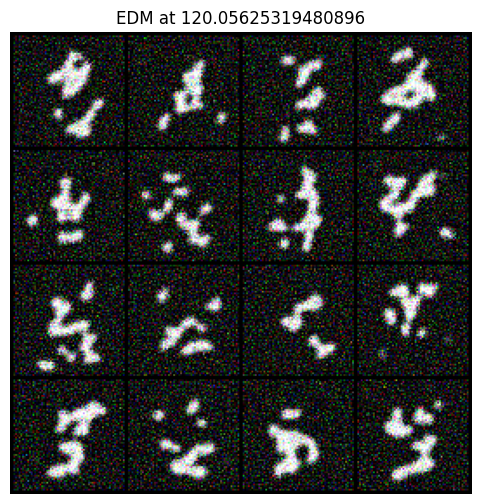

EDM Epoch 2 Loss: 0.5040:  50%|█████     | 235/469 [00:50<00:48,  4.84it/s]

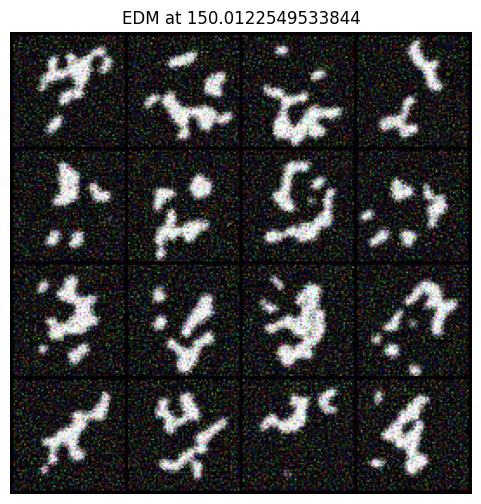

EDM Epoch 2 Loss: 0.5212:  80%|████████  | 376/469 [01:20<00:19,  4.76it/s]

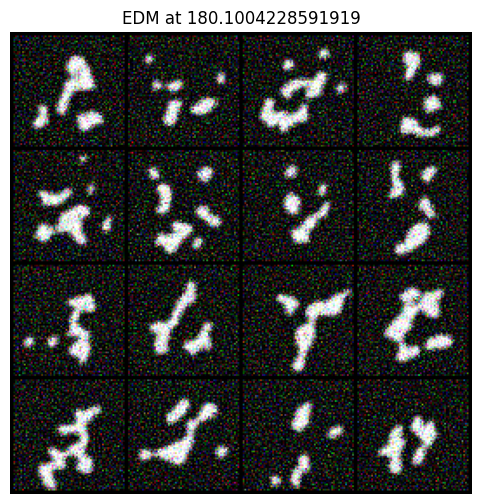

EDM Epoch 3 Loss: 0.5197:  10%|█         | 47/469 [00:10<01:28,  4.77it/s]

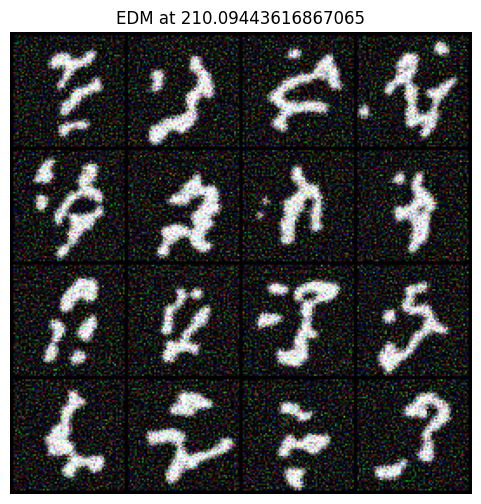

EDM Epoch 3 Loss: 0.5575:  40%|████      | 188/469 [00:40<00:59,  4.76it/s]

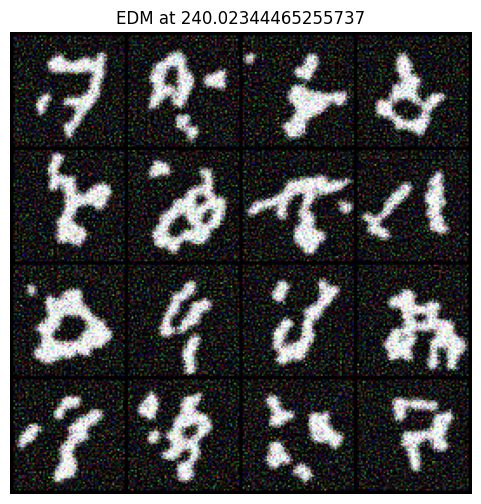

EDM Epoch 3 Loss: 0.5079:  70%|███████   | 330/469 [01:10<00:29,  4.78it/s]

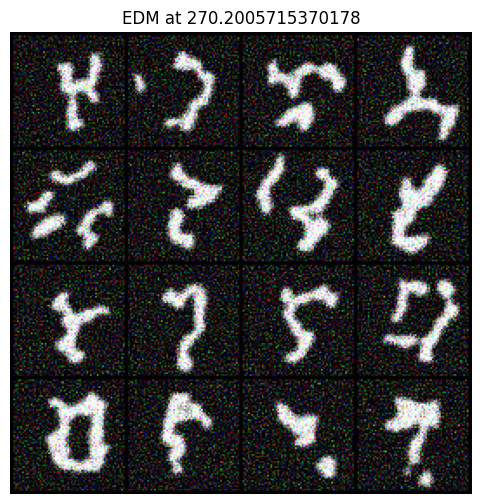

EDM Epoch 4 Loss: 0.5273:   0%|          | 0/469 [00:00<?, ?it/s]

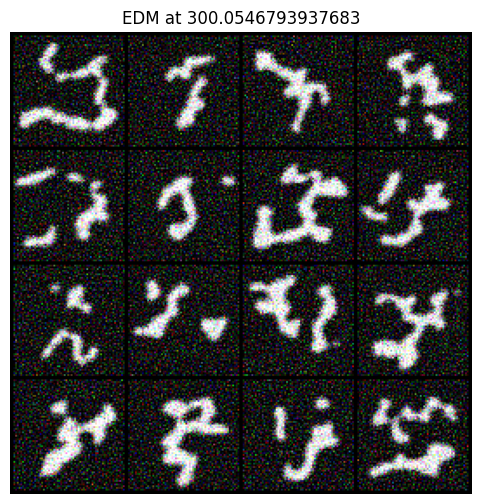

EDM Epoch 4 Loss: 0.5032:  30%|███       | 141/469 [00:30<01:08,  4.81it/s]

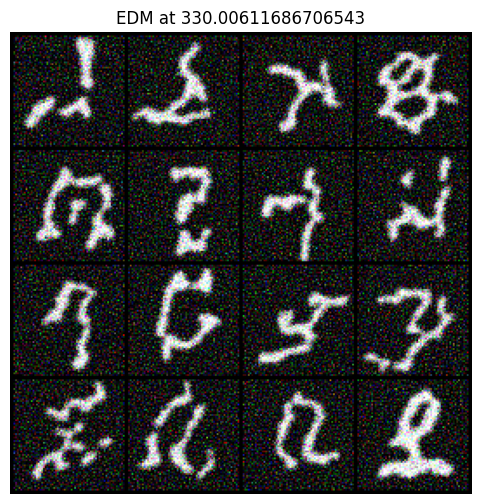

EDM Epoch 4 Loss: 0.5288:  60%|██████    | 282/469 [01:00<00:39,  4.79it/s]

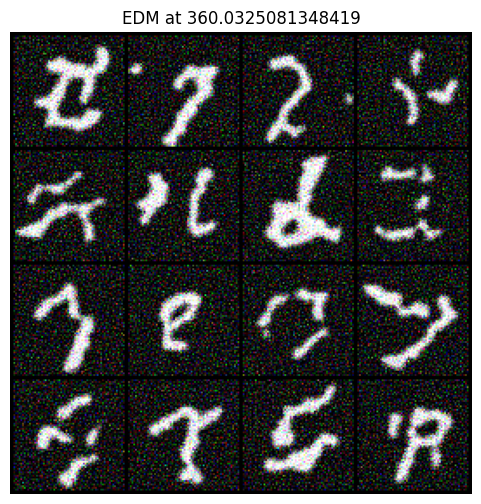

EDM Epoch 4 Loss: 0.5451:  90%|█████████ | 423/469 [01:30<00:09,  4.73it/s]

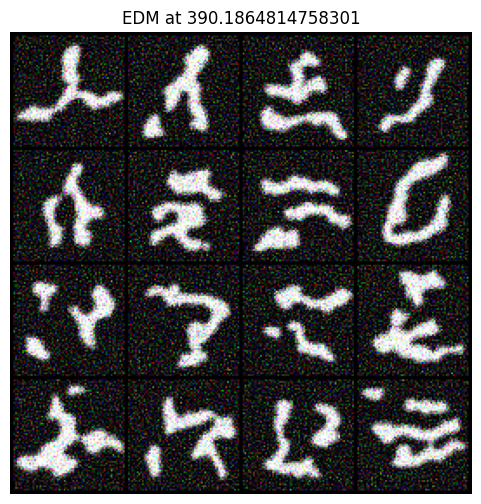

EDM Epoch 4 Loss: 0.5299:  99%|█████████▉| 465/469 [01:39<00:00,  4.66it/s]


KeyboardInterrupt: 

In [17]:
# EDM training loop - CORRECTED with proper preconditioning coefficients
# Following NVIDIA's EDMPrecond implementation exactly

model_edm = UNet128(use_attention=True).to(device)

edm_epochs = 999  # For demonstration; increase for better results
#model_edm = UNet28().to(device)
optimizer_edm = optim.Adam(model_edm.parameters(), lr=2e-4)
t0 = time.time()
next_display_time = t0
max_training_time = 30 * 60
for epoch in range(edm_epochs):
    if time.time() > t0 + max_training_time:
        break

    pbar = tqdm(train_loader)
    for x, _ in pbar:
        x = x.to(device)
        
        # Log-normal sigma sampling (as in NVIDIA's implementation)
        rnd_normal = torch.randn([x.shape[0], 1, 1, 1], device=device)
        sigma = (rnd_normal * P_std + P_mean).exp()
        
        # Preconditioning coefficients (from NVIDIA's EDMPrecond)
        c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
        c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
        c_in = 1 / (sigma_data ** 2 + sigma ** 2).sqrt()
        c_noise = sigma.log() / 4
        
        # Add noise: y_noisy = x + σ·n where n ~ N(0,I)
        noise = torch.randn_like(x) * sigma
        y_noisy = x + noise
        
        # Model prediction: F_x = net(c_in * y_noisy, c_noise)
        c_noise_input = c_noise.view(x.shape[0])
        F_x = model_edm(c_in * y_noisy, c_noise_input)
        
        # Preconditioning: D_x = c_skip * y_noisy + c_out * F_x
        D_x = c_skip * y_noisy + c_out * F_x
        
        # Loss weight: λ(σ) = (σ² + σ_data²) / (σ·σ_data)²
        weight = edm_loss_weight(sigma.squeeze(), sigma_data).view(-1, 1, 1, 1)
        
        # Loss: weighted MSE between preconditioning output and clean image
        loss = (weight * (D_x - x) ** 2).mean()
        
        optimizer_edm.zero_grad()
        loss.backward()
        optimizer_edm.step()
        pbar.set_description(f"EDM Epoch {epoch+1} Loss: {loss.item():.4f}")
        if time.time() > next_display_time or time.time() > t0 + max_training_time:
            next_display_time += display_interval
            show_edm_samples(model_edm,title=f"EDM at {time.time() - t0}")
            if time.time() > t0 + max_training_time:
                break
